In [54]:
import sys
sys.path.append("..") 
from utils.helpers import (
    read_from_json,
    watershed_lab,
    watershed_lab2,
    rgb_2_gray_unique,
    bbox_iou
)
import glob
import matplotlib.pyplot as plt
from imageio import imread
import numpy as np
from skimage import data, img_as_float
from skimage import exposure, filters
from imageio import imwrite
from skimage.measure import regionprops
from skimage.transform import resize

def sharpen(image):
    image = img_as_float(image)
    p5, p98 = np.percentile(image, (2, 98))
    img_rescale = exposure.rescale_intensity(image, in_range=(p5, p98))
    return img_rescale

In [2]:
imlist = glob.glob('/mnt/c/Users/trang.le/Desktop/shapemode/S-BIAD34/Files/HPA065871/*_cellmask.json')

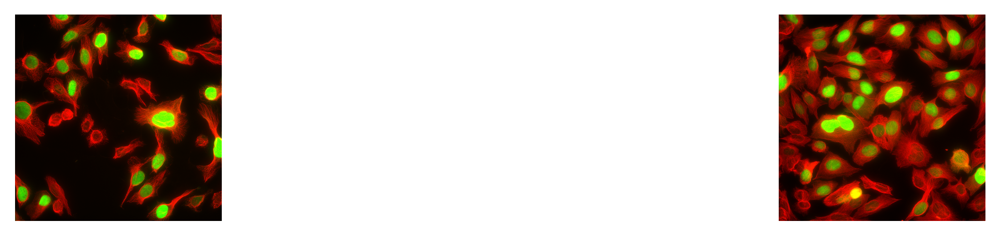

In [3]:
plt.figure(figsize=(12,4), dpi=300)
for k,f in enumerate(imlist):
    f = f.replace('_cellmask.json','_w1.tif')
    w1 = imread(f)
    w1 = sharpen(w1)
    w2 = imread(f.replace('w1.tif','w2.tif'))
    w2 = sharpen(w2)
    w3 = imread(f.replace('w1.tif','w3.tif'))
    w3 = sharpen(w3)
    img = np.stack([w1,w2,np.zeros_like(w1)])
    plt.subplot(2,len(imlist),k+1)
    img = img.transpose(1,2,0)
    plt.imshow(img)
    plt.axis('off')

In [5]:
nuclei_mask, _ = watershed_lab(w2+w3, marker=None, rm_border=False)

marker = np.zeros_like(nuclei_mask)
marker[nuclei_mask > 0] = nuclei_mask[nuclei_mask > 0] + 1  # foreground
cell_mask = watershed_lab2(w1, marker=marker)

In [135]:
tmp = sharpen(w2+w3)
bi_adapt = filters.threshold_local(tmp, block_size=75, method='gaussian')
bin_mask = (tmp>bi_adapt).astype('uint8')

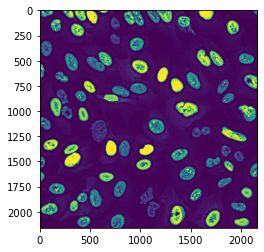

In [136]:
filters.threshold_otsu(tmp)
plt.imshow(bin_mask*tmp)
#plt.imshow(tmp[tmp>bi_adapt])

In [5]:

imwrite("eg.png", (img*256).astype('uint8'))
imwrite("fucci.png", (bin_mask*tmp*256).astype('uint8'))

NameError: name 'bin_mask' is not defined

# Bad segmentation by watershed

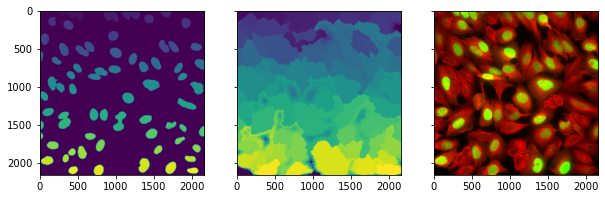

In [84]:
fig, ax = plt.subplots(1,3, figsize=(10,10),sharex=True, sharey=True)
ax[0].imshow(nuclei_mask)
ax[1].imshow(cell_mask)
ax[2].imshow(img)

/tmp/ipykernel_2485/3630809167.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,3, figsize=(10,10),sharex=True, sharey=True)


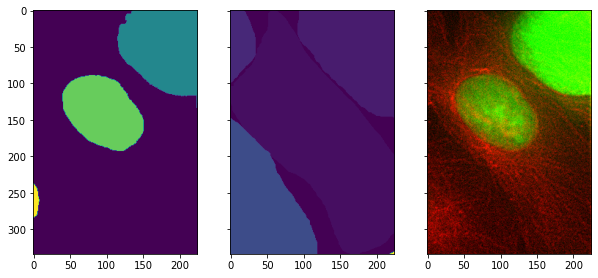

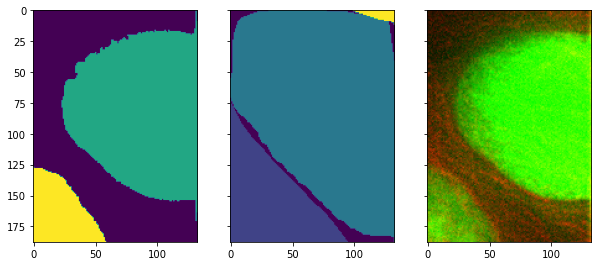

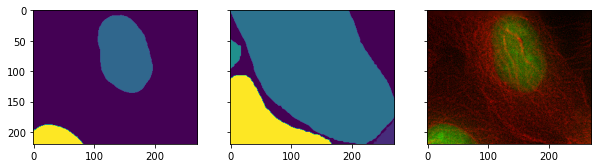

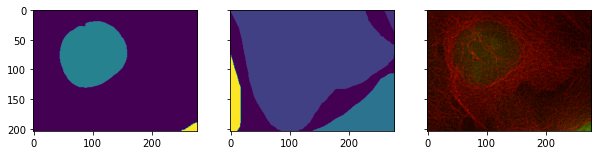

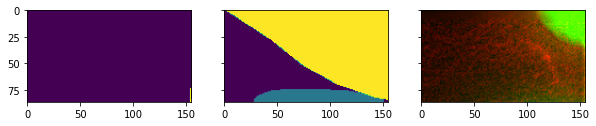

...

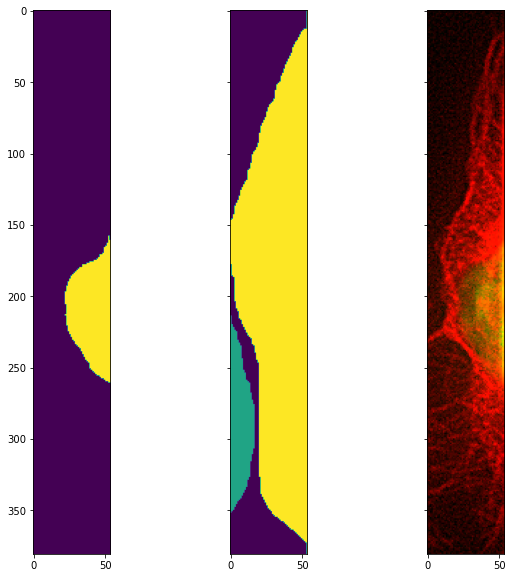

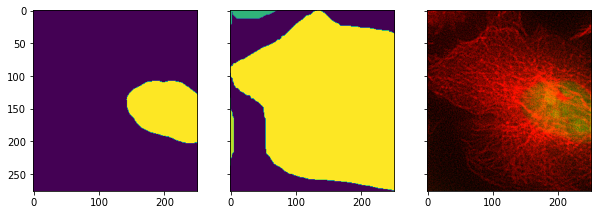

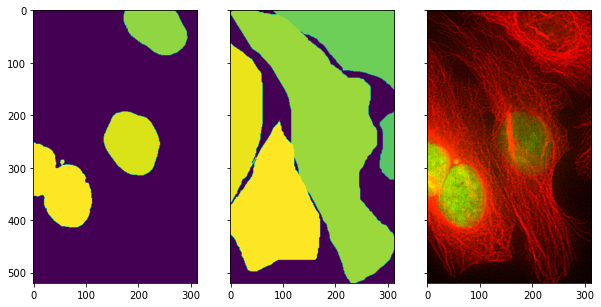

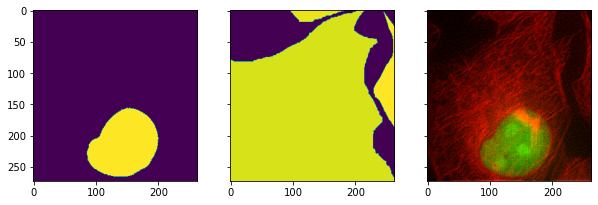

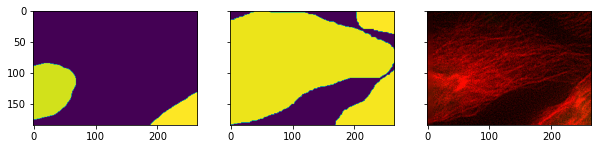

In [9]:

for region_c, region_n in zip(regionprops(cell_mask), regionprops(nuclei_mask)):  
    minr, minc, maxr, maxc = region_c.bbox
    # get mask
    mask = cell_mask[minr:maxr, minc:maxc].astype(np.uint8)
    fig, ax = plt.subplots(1,3, figsize=(10,10),sharex=True, sharey=True)
    ax[0].imshow(nuclei_mask[minr:maxr, minc:maxc])
    ax[1].imshow(cell_mask[minr:maxr, minc:maxc])
    ax[2].imshow(img[minr:maxr, minc:maxc,:])

# Annotate 2-3 images in Kaibu

In [7]:
def match_cell_id(nuclei_mask, cell_mask):    
    assert nuclei_mask.shape == cell_mask.shape
    # Relabel the cytosol region based on nuclei labels
    nu_regionprops = regionprops(nuclei_mask)
    cyto_regionprops = regionprops(cell_mask)
    nuclei_mask_ = np.zeros_like(nuclei_mask)
    cell_mask_ = np.zeros_like(cell_mask)
    matched_ID = []
    for region in nu_regionprops:
        new_label = region.label
        match = dict()
        x1 = [str(x) for x in region.coords]
        for r in cyto_regionprops:
            if r.label in matched_ID:
                continue
            x2 = [str(x) for x in r.coords]
            overlap_px = set(x1).intersection(x2)
            if len(overlap_px)> 0:
                match[str(r.label)] = len(overlap_px)
        if len(match.keys())==0:
            # If don't find any corresponding cell/nuclei, delete this mask
            print(f'Dont find cell {new_label}')
            #nuclei_mask[nu == new_label] = 0
        else:
            # if find multiple matches, pick the highest overlap. This case include the case with only 1 match
            highest_match= max(match, key= lambda x: match[x])
            #print(highest_match, new_label)
            cell_mask_[cell_mask == int(highest_match)] = new_label
            nuclei_mask_[nuclei_mask == new_label] = new_label
            matched_ID += [int(highest_match)]
    assert set(np.unique(nuclei_mask_)) == set(np.unique(cell_mask_))
    
    #cell_mask_ = skimage.morphology.erosion(nuclei_mask, skimage.morphology.square(3)) + cell_mask
    # remove small patches
    #cell_mask_ = skimage.morphology.erosion(cell_mask_, skimage.morphology.square(5))
    #cell_mask_ = skimage.morphology.dilation(cell_mask_, skimage.morphology.square(5))
    return nuclei_mask_, cell_mask_

Dont find cell 21
Dont find cell 74
Dont find cell 78


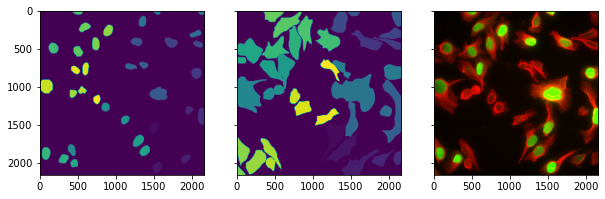

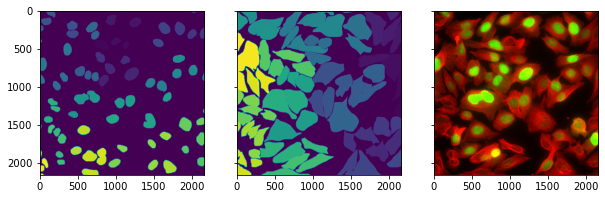

In [10]:
from imageio import imwrite
from utils.geojson_helpers import geojson_to_masks
for f in imlist: #f = '/mnt/c/Users/trang.le/Desktop/shapemode/S-BIAD34/Files/HPA047549/5985_B03_s4_w1.tif'
    nu_mask = geojson_to_masks(f.replace('cellmask.json','nucleimask.json'), mask_types=["labels"], img_size=w1.shape)['labels']
    cell_mask = geojson_to_masks(f, mask_types=["labels"], img_size=w1.shape)['labels']
    f = f.replace('_cellmask.json','_w1.tif')
    w1 = imread(f)
    w1 = sharpen(w1)
    w2 = imread(f.replace('w1.tif','w2.tif'))
    w2 = sharpen(w2)
    w3 = imread(f.replace('w1.tif','w3.tif'))
    w3 = sharpen(w3)
    img = np.stack([w1,w2,np.zeros_like(w1)])
    img = img.transpose(1,2,0)
    fig, ax = plt.subplots(1,3, figsize=(10,10),sharex=True, sharey=True)
    ax[0].imshow(nu_mask)
    ax[1].imshow(cell_mask)
    ax[2].imshow(img)
    n_m, c_m = match_cell_id(nu_mask, cell_mask)
    imwrite(f.replace("_w1.tif","_nucleimask.png"), n_m)
    imwrite(f.replace("_w1.tif","_cellmask.png"), c_m)

In [ ]:
f

/tmp/ipykernel_355/3493115171.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,3, figsize=(10,10),sharex=True, sharey=True)


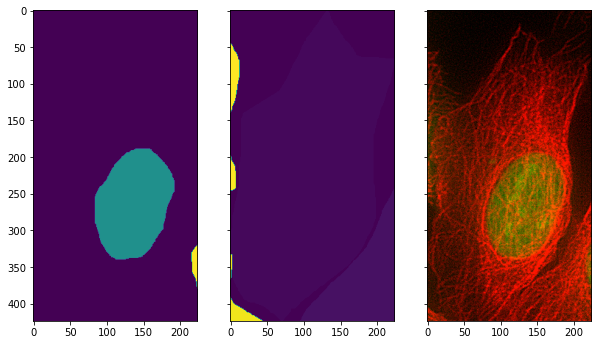

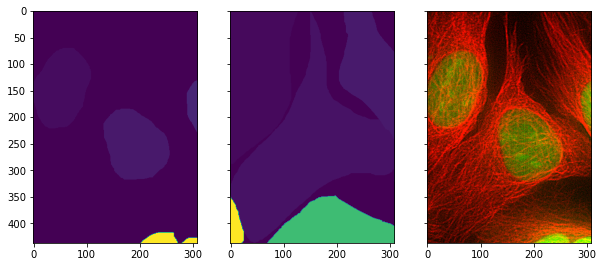

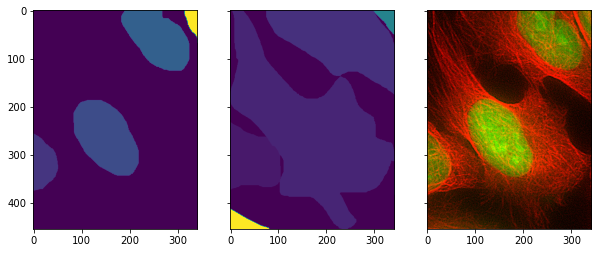

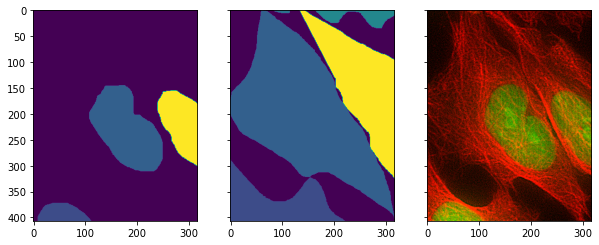

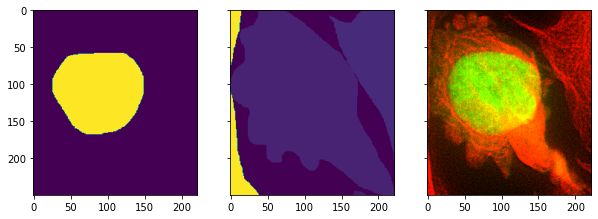

...

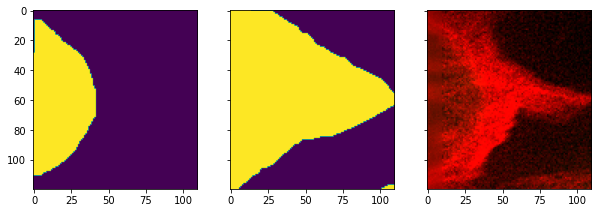

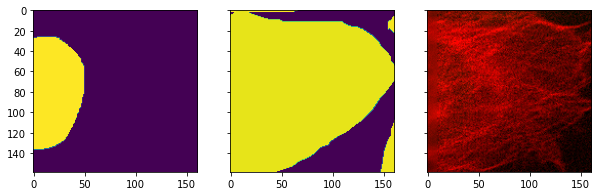

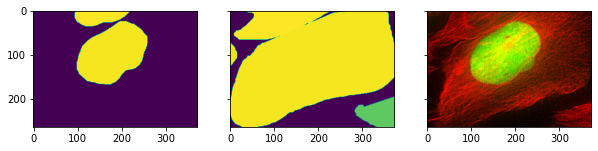

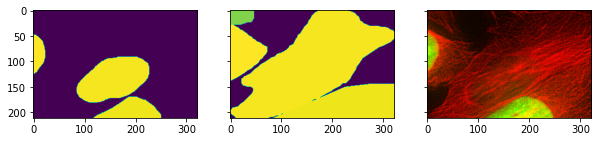

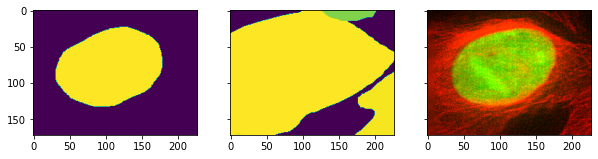

In [18]:
for region_c, region_n in zip(regionprops(c_m), regionprops(n_m)):  
    minr, minc, maxr, maxc = region_c.bbox
    # get mask
    mask = c_m[minr:maxr, minc:maxc].astype(np.uint8)
    fig, ax = plt.subplots(1,3, figsize=(10,10),sharex=True, sharey=True)
    ax[0].imshow(n_m[minr:maxr, minc:maxc])
    ax[1].imshow(c_m[minr:maxr, minc:maxc])
    ax[2].imshow(img[minr:maxr, minc:maxc,:])

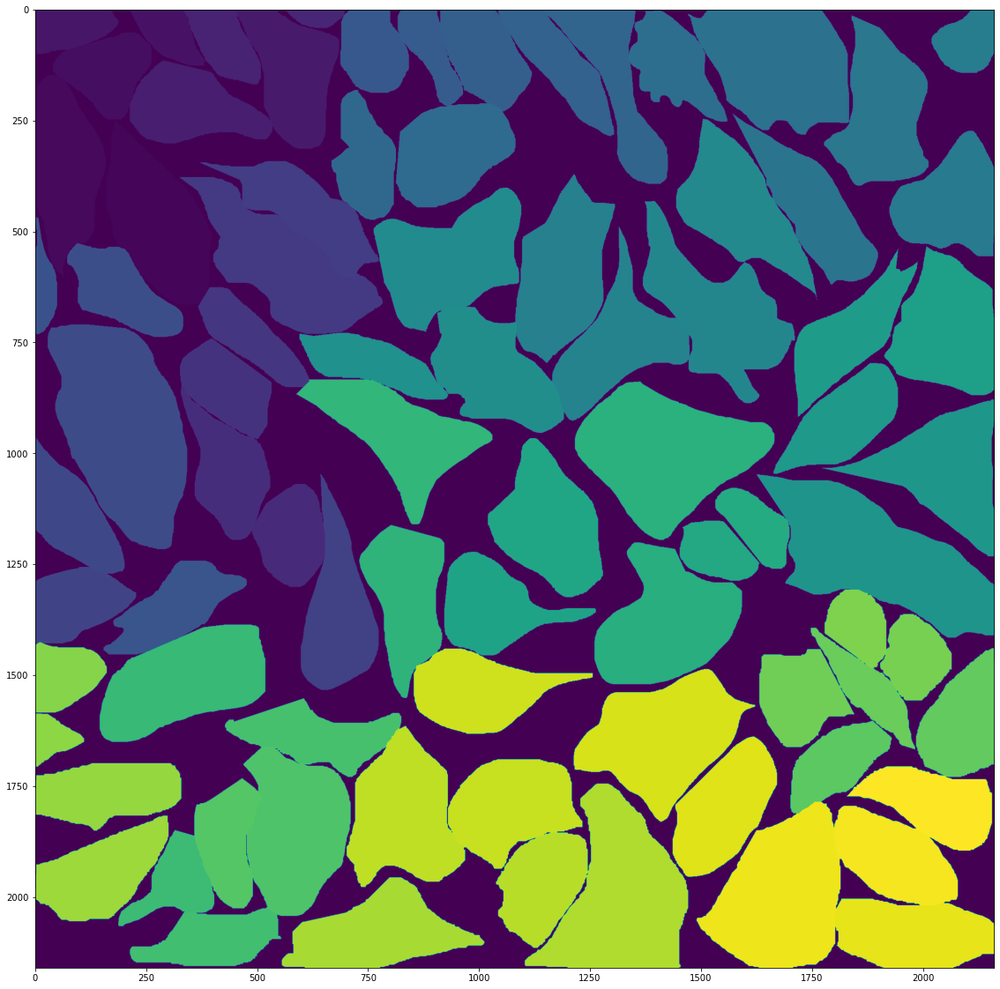

In [187]:
plt.figure(figsize = (20,20))
plt.imshow(cell_mask)

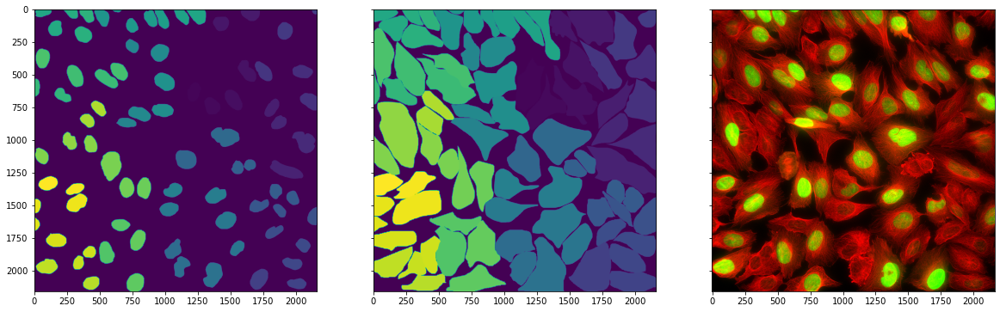

In [189]:
fig, ax = plt.subplots(1,3, figsize=(20,20),sharex=True, sharey=True)
ax[0].imshow(n_m)
ax[1].imshow(c_m)
ax[2].imshow(img)

In [20]:
import shutil
save_dir = '/mnt/c/Users/trang.le/Desktop/shapemode/S-BIAD34/train'
imlist = glob.glob('/mnt/c/Users/trang.le/Desktop/shapemode/S-BIAD34/Files/*/*_cellmask.png')
chs = ['w1.tif','w2.tif','w3.tif','w4_Rescaled.tif','nucleimask.png']

for f in imlist:
    ab = f.split('/')[-2]
    fov = f.split('/')[-1]
    shutil.copy(f,f"{save_dir}/{ab}_{fov}")
    for ch in chs:
        file_ = f.replace('cellmask.png',ch)
        fov = file_.split('/')[-1]
        shutil.copy(file_,f"{save_dir}/{ab}_{fov}")


In [23]:
import os
save_dir = '/mnt/c/Users/trang.le/Desktop/shapemode/S-BIAD34/test'
imlist = glob.glob('/mnt/c/Users/trang.le/Desktop/shapemode/S-BIAD34/Files/*/*_w1.tif')
imlist = [f for f in imlist if not os.path.exists(f.replace('w1.tif','cellmask.json'))]
chs = ['w2.tif','w3.tif','w4_Rescaled.tif']

for f in imlist:
    ab = f.split('/')[-2]
    fov = f.split('/')[-1]
    shutil.copy(f,f"{save_dir}/{ab}_{fov}")
    for ch in chs:
        file_ = f.replace('w1.tif',ch)
        fov = file_.split('/')[-1]
        shutil.copy(file_,f"{save_dir}/{ab}_{fov}")

/mnt/c/Users/trang.le/Desktop/QCs/crowded_cells/HPA000540_5977_C01_s4_nucleimask.json
/mnt/c/Users/trang.le/Desktop/QCs/crowded_cells/HPA003719_5977_B06_s1_cellmask.json
/mnt/c/Users/trang.le/Desktop/QCs/crowded_cells/HPA007643_5977_A12_s4_cellmask.json
/mnt/c/Users/trang.le/Desktop/QCs/crowded_cells/HPA007643_5977_A12_s4_nucleimask.json
/mnt/c/Users/trang.le/Desktop/QCs/crowded_cells/HPA036299_5977_A01_s4_cellmask.json
/mnt/c/Users/trang.le/Desktop/QCs/crowded_cells/HPA039973_5977_A01_s5_cellmask.json
/mnt/c/Users/trang.le/Desktop/QCs/crowded_cells/HPA040004_5977_B01_s5_cellmask.json


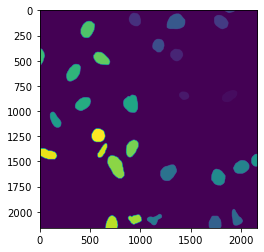

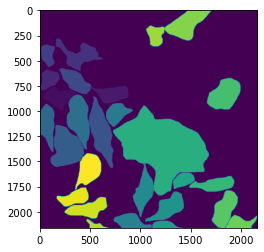

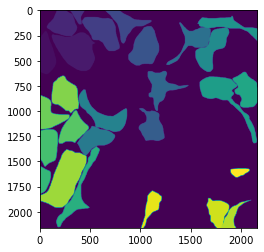

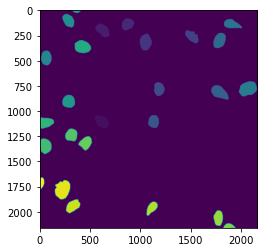

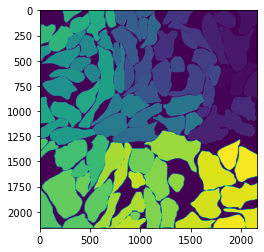

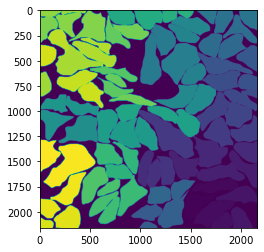

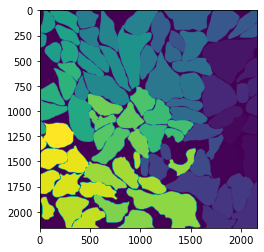

In [55]:
from imageio import imwrite
from utils.geojson_helpers import geojson_to_masks
imlist = glob.glob('/mnt/c/Users/trang.le/Desktop/QCs/crowded_cells/*.json')
for f in imlist: #f = '/mnt/c/Users/trang.le/Desktop/shapemode/S-BIAD34/Files/HPA047549/5985_B03_s4_w1.tif'
    print(f)
    w1 = imread(f.rsplit('_',1)[0]+'_w1.tif')
    _mask = geojson_to_masks(f, mask_types=["labels"], img_size=w1.shape)['labels']
    imwrite(f.replace(".json",".png"), _mask)
    plt.figure()
    plt.imshow(_mask)

In [8]:
cell_mask = imread(imlist[0].replace('.json','.png'))
nuclei_mask = imread(imlist[0].replace('cellmask.json','nucleimask.png'))

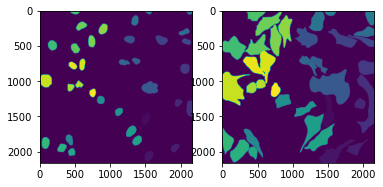

In [14]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(nuclei_mask)
ax[1].imshow(cell_mask)

In [45]:
def coords_to_str(coords):
    l = []
    for c in coords:
        l += [','.join(str(x) for x in c)]
    return l

nu_regionprops = regionprops(nuclei_mask)
cyto_regionprops = regionprops(cell_mask)

nu_regions_coords = {r.label : coords_to_str(r.coords) for r in nu_regionprops}
cyto_regions_coords = {r.label : coords_to_str(r.coords) for r in cyto_regionprops}


In [52]:
%%timeit -n 1
nu_regions_coords = {r.label : [str(x) for x in r.coords] for r in nu_regionprops}

37.6 s ± 1.59 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [51]:
%%timeit -n 1
nu_regions_coords = {r.label : coords_to_str(r.coords) for r in nu_regionprops}

2.68 s ± 87.5 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


# Adaptive thresholding

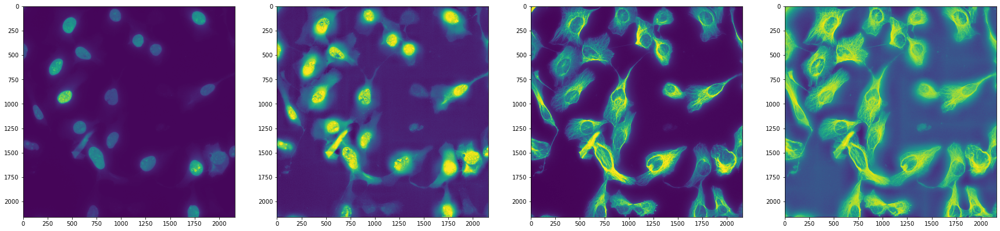

In [70]:
def sharpen(image):
    image = img_as_float(image)
    p2, p98 = np.percentile(image, (5, 98))
    img_rescale = exposure.rescale_intensity(image, in_range=(p2, p98))
    return img_rescale

im = '/mnt/c/Users/trang.le/Desktop/QCs/crowded_cells/HPA000540_5977_C01_s4_'
fig, ax = plt.subplots(1,4, figsize=(30,10))
w2 = imread(im + 'w2.tif')
ax[0].imshow(w2)
# Adaptive Equalization
img_adapteq = exposure.equalize_adapthist(w2, kernel_size=110, clip_limit=0.05)     
ax[1].imshow(sharpen(img_adapteq))

w1 = imread(im + 'w1.tif')
ax[2].imshow(sharpen(w1))
w1_ad = exposure.equalize_adapthist(w1, kernel_size=220, clip_limit=0.1)     
ax[3].imshow(w1_ad) 